In [4]:
import pandas as pd
#import pandas_profiling as pp #not needed for deployment
import matplotlib.pyplot as plt
%matplotlib inline
import category_encoders as ce
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
import numpy as np
from pdpbox.pdp import pdp_isolate, pdp_plot
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint, uniform
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import shap
from joblib import dump, load
from random import randrange

ModuleNotFoundError: No module named 'psutil'

In [3]:
pd.options.display.max_columns = 999

In [4]:
df = pd.read_csv('vehicles_cleaned.csv')

In [5]:
df.head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,cityUF,co2,co2A,co2TailpipeAGpm,co2TailpipeGpm,comb08,comb08U,combA08,combA08U,combE,combinedCD,combinedUF,cylinders,displ,drive,engId,eng_dscr,feScore,fuelCost08,fuelCostA08,fuelType,fuelType1,ghgScore,ghgScoreA,highway08,highway08U,highwayA08,highwayA08U,highwayCD,highwayE,highwayUF,hlv,hpv,id,lv2,lv4,make,model,mpgData,phevBlended,pv2,pv4,range,rangeCity,rangeCityA,rangeHwy,rangeHwyA,trany,UCity,UCityA,UHighway,UHighwayA,VClass,year,youSaveSpend,guzzler,trans_dscr,tCharger,sCharger,atvType,fuelType2,rangeA,evMotor,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb
0,15.695714,0.0,0,0.0,19,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,423.190476,21,0.0,0,0.0,0.0,0.0,0.0,4,2.0,Rear-Wheel Drive,9011,(FFS),-1,1850,0,Regular,Regular Gasoline,-1,-1,25,0.0,0,0.0,0.0,0.0,0.0,0,0,1,0,0,Alfa Romeo,Spider Veloce 2000,Y,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,23.3333,0.0,35.0000,0.0,Two Seaters,1985,-2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
1,29.964545,0.0,0,0.0,9,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,807.909091,11,0.0,0,0.0,0.0,0.0,0.0,12,4.9,Rear-Wheel Drive,22020,(GUZZLER),-1,3550,0,Regular,Regular Gasoline,-1,-1,14,0.0,0,0.0,0.0,0.0,0.0,0,0,10,0,0,Ferrari,Testarossa,N,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,11.0000,0.0,19.0000,0.0,Two Seaters,1985,-10500,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
2,12.207778,0.0,0,0.0,23,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,329.148148,27,0.0,0,0.0,0.0,0.0,0.0,4,2.2,Front-Wheel Drive,2100,(FFS),-1,1450,0,Regular,Regular Gasoline,-1,-1,33,0.0,0,0.0,0.0,0.0,0.0,19,77,100,0,0,Dodge,Charger,Y,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,29.0000,0.0,47.0000,0.0,Subcompact Cars,1985,0,NaN,SIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
3,29.964545,0.0,0,0.0,10,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,807.909091,11,0.0,0,0.0,0.0,0.0,0.0,8,5.2,Rear-Wheel Drive,2850,NaN,-1,3550,0,Regular,Regular Gasoline,-1,-1,12,0.0,0,0.0,0.0,0.0,0.0,0,0,1000,0,0,Dodge,B150/B250 Wagon 2WD,N,False,0,0,0,0,0.0,0,0.0,Automatic 3-spd,12.2222,0.0,16.6667,0.0,Vans,1985,-10500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
4,17.347895,0.0,0,0.0,17,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,467.736842,19,0.0,0,0.0,0.0,0.0,0.0,4,2.2,4-Wheel or All-Wheel Drive,66031,"(FFS,TRBO)",-1,2600,0,Premium,Premium Gasoline,-1,-1,23,0.0,0,0.0,0.0,0.0,0.0,0,0,10000,0,14,Subaru,Legacy AWD Turbo,N,False,0,90,0,0,0.0,0,0.0,Manual 5-spd,21.0000,0.0,32.0000,0.0,Compact Cars,1993,-5750,NaN,NaN,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0


In [6]:
df.describe()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,cityUF,co2,co2A,co2TailpipeAGpm,co2TailpipeGpm,comb08,comb08U,combA08,combA08U,combE,combinedCD,combinedUF,cylinders,displ,engId,feScore,fuelCost08,fuelCostA08,ghgScore,ghgScoreA,highway08,highway08U,highwayA08,highwayA08U,highwayCD,highwayE,highwayUF,hlv,hpv,id,lv2,lv4,pv2,pv4,range,rangeCity,rangeCityA,rangeHwy,rangeHwyA,UCity,UCityA,UHighway,UHighwayA,year,youSaveSpend,c240Dscr,charge240b,c240bDscr,phevCity,phevHwy,phevComb
count,39542.000000,39542.000000,39542.0,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.0,39542.0,39542.000000,39542.0,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,39542.000000,0.0,39542.0,0.0,39542.000000,39542.000000,39542.000000
mean,17.418842,0.180770,0.0,0.004110,17.894593,5.639461,0.443225,0.291584,0.000331,0.043313,0.000752,90.161980,3.290172,14.942669,470.051278,20.177937,6.372479,0.486951,0.311833,0.045751,0.000275,0.000729,5.734738,3.309013,7849.152673,0.338400,2229.985838,83.429012,0.333569,-0.956527,24.110920,7.624603,0.562516,0.352290,0.000206,0.048973,0.000700,1.880153,9.638764,20375.355369,1.718350,5.912296,13.149689,33.100147,0.0,0.0,0.048349,0.0,0.042145,22.527152,0.558239,33.791609,0.761974,2001.957792,-3897.836478,NaN,0.0,NaN,0.078423,0.071291,0.075034
std,4.461915,1.059339,0.0,0.124743,4.942953,9.524493,4.042890,3.818164,0.038462,1.240851,0.021747,176.336299,46.714833,87.619924,119.049191,5.235836,10.641496,4.026024,3.728193,1.303830,0.034283,0.021174,1.753540,1.356245,16966.712990,2.636923,609.707324,487.638197,2.626503,0.469991,5.916389,12.603070,4.163556,3.754654,0.028874,1.388218,0.020474,5.795755,27.323510,12143.254466,4.231223,9.426470,30.687808,45.848233,0.0,0.0,1.690507,0.0,1.467730,6.864279,5.637918,8.853541,5.874995,10.907135,3051.953954,NaN,0.0,NaN,2.299626,2.057321,2.182387
min,0.060000,0.000000,0.0,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,22.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.600000,0.000000,-1.000000,700.000000,0.000000,-1.000000,-1.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1984.000000,-27750.000000,NaN,0.0,NaN,0.000000,0.000000,0.000000
25%,14.330870,0.000000,0.0,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,386.391304,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.200000,0.000000,-1.000000,1800.000000,0.000000,-1.000000,-1.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9886.250000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,18.100000,0.000000,27.600000,0.000000,1992.000000,-5750.000000,NaN,0.0,NaN,0.000000,0.000000,0.000000
50%,16.480500,0.000000,0.0,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,446.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,3.000000,142.000000,-1.000000,2200.000000,0.000000,-1.000000,-1.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19781.500000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,21.232500,0.000000,33.126700,0.000000,2003.000000,-3750.000000,NaN,0.0,NaN,0.000000,0.000000,0.000000
75%,19

In [7]:
df.describe(exclude='number')

,drive,eng_dscr,fuelType,fuelType1,make,model,mpgData,phevBlended,trany,VClass,guzzler,trans_dscr,tCharger,sCharger,atvType,fuelType2,rangeA,evMotor,mfrCode,createdOn,modifiedOn,startStop
count,39542,23547,39542,39542,39542,39542,39542,39542,39540,39542,2350,15047,6764,803,2868,1205,1200,558,9948,39542,39542,9083
unique,7,505,12,5,130,3923,2,2,36,34,3,52,1,1,7,4,180,57,44,270,140,2
top,Front-Wheel Drive,(FFS),Regular,Regular Gasoline,Chevrolet,F150 Pickup 2WD,N,False,Automatic 4-spd,Compact Cars,G,CLKUP,T,S,FFV,E85,290,288V Ni-MH,GMX,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,N
freq,14091,8484,25507,26651,3837,218,26422,39510,10790,5565,1407,7809,6764,803,1126,1126,74,123,1343,32782,28155,5887


In [8]:
# pp.ProfileReport(df)
# pp.ProfileReport(df, perform_check_correlation = False)
df.profile_report(style={'full_width':True}, check_correlation_pearson = False, check_correlation_cramers = False)

In [9]:
# from IPython.display import display, Image
# url = 'https://cdn-images-1.medium.com/max/1600/1*vYGFQCafJtGBBX5mbl0xyw.png'
# example = Image(url=url, width=600)

# display(example)
from IPython.display import display, Image
manifest = Image(filename='Screenshot-2019-8-19 Fuel Economy Web Services.png')

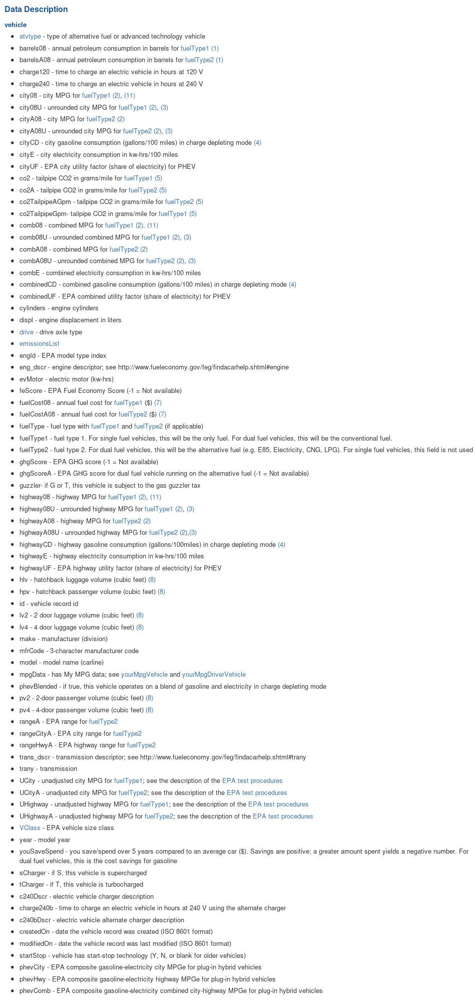

In [10]:
display(manifest)

In [11]:
df.columns

Index(['barrels08', 'barrelsA08', 'charge120', 'charge240', 'city08',
       'city08U', 'cityA08', 'cityA08U', 'cityCD', 'cityE', 'cityUF', 'co2',
       'co2A', 'co2TailpipeAGpm', 'co2TailpipeGpm', 'comb08', 'comb08U',
       'combA08', 'combA08U', 'combE', 'combinedCD', 'combinedUF', 'cylinders',
       'displ', 'drive', 'engId', 'eng_dscr', 'feScore', 'fuelCost08',
       'fuelCostA08', 'fuelType', 'fuelType1', 'ghgScore', 'ghgScoreA',
       'highway08', 'highway08U', 'highwayA08', 'highwayA08U', 'highwayCD',
       'highwayE', 'highwayUF', 'hlv', 'hpv', 'id', 'lv2', 'lv4', 'make',
       'model', 'mpgData', 'phevBlended', 'pv2', 'pv4', 'range', 'rangeCity',
       'rangeCityA', 'rangeHwy', 'rangeHwyA', 'trany', 'UCity', 'UCityA',
       'UHighway', 'UHighwayA', 'VClass', 'year', 'youSaveSpend', 'guzzler',
       'trans_dscr', 'tCharger', 'sCharger', 'atvType', 'fuelType2', 'rangeA',
       'evMotor', 'mfrCode', 'c240Dscr', 'charge240b', 'c240bDscr',
       'createdOn', 'modifiedOn

In [ ]:
# 'city08', 'city08U', 'cityA08', 'cityA08U', 'cityCD', 'cityE', 'cityUF', 'co2',
#        'co2A', 'co2TailpipeAGpm', 'co2TailpipeGpm', 'comb08', 'comb08U',
#        'combA08', 'combA08U', 'cylinders',
#        'displ', 'drive', 'engId', 'eng_dscr', 'feScore', 'fuelType', 'fuelType1', 'ghgScore', 'ghgScoreA',
#        'highway08', 'highway08U', 'highwayA08', 'highwayA08U', 'highwayCD',
#        'highwayE', 'highwayUF', 'hlv', 'hpv', 'id', 'lv2', 'lv4', 'make',
#        'model', 'mpgData', 'phevBlended', 'pv2', 'pv4', 'range', 'rangeCity',
#        'rangeCityA', 'rangeHwy', 'rangeHwyA', 'trany', 'UCity', 'UCityA',
#        'UHighway', 'UHighwayA', 'VClass', 'year', 'youSaveSpend', 'guzzler',
#        'trans_dscr', 'tCharger', 'sCharger', 'atvType', 'fuelType2', 'rangeA',
#        'mfrCode', 'c240Dscr', 'charge240b', 'c240bDscr',
#        'createdOn', 'modifiedOn', 'startStop', 'phevCity', 'phevHwy',
#        'phevComb'

**New features to eliminate alternative fuels and make better combined MPG data**

In [12]:
df['Conventional'] = df.fuelType2.isnull()
df['CombMPG'] = np.where(df.comb08U == 0, df.comb08, df.comb08U)

In [13]:
df[df.Conventional == False].head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,cityUF,co2,co2A,co2TailpipeAGpm,co2TailpipeGpm,comb08,comb08U,combA08,combA08U,combE,combinedCD,combinedUF,cylinders,displ,drive,engId,eng_dscr,feScore,fuelCost08,fuelCostA08,fuelType,fuelType1,ghgScore,ghgScoreA,highway08,highway08U,highwayA08,highwayA08U,highwayCD,highwayE,highwayUF,hlv,hpv,id,lv2,lv4,make,model,mpgData,phevBlended,pv2,pv4,range,rangeCity,rangeCityA,rangeHwy,rangeHwyA,trany,UCity,UCityA,UHighway,UHighwayA,VClass,year,youSaveSpend,guzzler,trans_dscr,tCharger,sCharger,atvType,fuelType2,rangeA,evMotor,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb,Conventional,CombMPG
7116,14.982273,0.093000,0,0.0,20,0.0,18,0.0,0.0,0.0,0.0,-1,-1,354.476250,403.954545,22,0.0,20,0.0,0.0,0.0,0.0,4,2.2,Front-Wheel Drive,0,NONE,-1,1800,1650,Gasoline or natural gas,Regular Gasoline,-1,-1,25,0.0,25,0.0,0.0,0.0,0.0,0,0,16403,0,7,Chevrolet,Cavalier (Bi-fuel CNG),Y,False,0,92,0,0,0.0,0,0.0,Automatic 3-spd,24.5984,22.5446,35.3000,34.6154,Subcompact Cars,2000,-1750,NaN,NaN,NaN,NaN,Bifuel (CNG),Natural Gas,360,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,False,22.0
7122,16.480500,4.994000,0,0.0,17,0.0,12,0.0,0.0,0.0,0.0,-1,-1,413.466667,444.350000,20,0.0,15,0.0,0.0,0.0,0.0,6,3.0,Front-Wheel Drive,0,FLEX-FUEL,-1,1950,2300,Gasoline or E85,Regular Gasoline,-1,-1,26,0.0,19,0.0,0.0,0.0,0.0,0,0,16409,0,16,Ford,Taurus,Y,False,0,104,0,0,0.0,0,0.0,Automatic 4-spd,21.4000,15.6000,36.7000,26.9000,Large Cars,2000,-2500,NaN,CLKUP,NaN,NaN,FFV,E85,290,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,False,20.0
7124,16.480500,5.350714,0,0.0,17,0.0,12,0.0,0.0,0.0,0.0,-1,-1,443.000000,444.350000,20,0.0,14,0.0,0.0,0.0,0.0,6,3.0,Front-Wheel Drive,0,FLEX-FUEL,-1,1950,2500,Gasoline or E85,Regular Gasoline,-1,-1,25,0.0,18,0.0,0.0,0.0,0.0,0,0,16410,0,39,Ford,Taurus Wagon,Y,False,0,104,0,0,0.0,0,0.0,Automatic 4-spd,20.7000,15.1000,34.7000,25.4000,Midsize Station Wagons,2000,-2500,NaN,CLKUP,NaN,NaN,FFV,E85,290,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,False,20.0
7125,19.388824,6.242500,0,0.0,15,0.0,11,0.0,0.0,0.0,0.0,-1,-1,516.833333,522.764706,17,0.0,12,0.0,0.0,0.0,0.0,6,3.0,Rear-Wheel Drive,0,FLEX-FUEL,-1,2300,2900,Gasoline or E85,Regular Gasoline,-1,-1,20,0.0,15,0.0,0.0,0.0,0.0,0,0,16411,0,0,Ford,Ranger 2WD FFV,Y,False,0,0,0,0,0.0,0,0.0,Automatic 4-spd,18.4714,13.3899,28.3722,20.3779,Standard Pickup Trucks 2WD,2000,-4250,NaN,CLKUP,NaN,NaN,FFV,E85,230/270/270,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Mon May 05 00:00:00 EDT 2014,NaN,0,0,0,False,17.0
7126,18.311667,5.762308,0,0.0,16,0.0,12,0.0,0.0,0.0,0.0,-1,-1,477.076923,493.722222,18,0.0,13,0.0,0.0,0.0,0.0,6,3.0,Rear-Wheel Drive,0,FLEX-FUEL,-1,2200,2650,Gasoline or E85,Regular Gasoline,-1,-1,21,0.0,16,0.0,0.0,0.0,0.0,0,0,16412,0,0,Ford,Ranger 2WD FFV,Y,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,19.5097,14.5524,29.2301,21.6378,Standard Pickup Trucks 2WD,2000,-3750,NaN,NaN,NaN,NaN,FFV,E85,240/290/290,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Mon May 05 00:00:00 EDT 2014,NaN,0,0,0,False,18.0


In [12]:
# # wrangle the data
# target = 'comb08U'
# # features = ['co2TailpipeGpm', 'cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year', 'comb08U']
# features = ['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year', 'comb08U'] #co2 may be a leak feature

In [21]:
# Do train/validate/test 3-way split
# wrangle the data
# fit to a model 

In [13]:
df2 = df[features]

In [68]:
df2.head()

,cylinders,displ,drive,fuelType,pv2,pv4,trany,year,comb08U
0,4.0,2.0,Rear-Wheel Drive,Regular,0,0,Manual 5-spd,1985,0.0
1,12.0,4.9,Rear-Wheel Drive,Regular,0,0,Manual 5-spd,1985,0.0
2,4.0,2.2,Front-Wheel Drive,Regular,0,0,Manual 5-spd,1985,0.0
3,8.0,5.2,Rear-Wheel Drive,Regular,0,0,Automatic 3-spd,1985,0.0
4,4.0,2.2,4-Wheel or All-Wheel Drive,Premium,0,90,Manual 5-spd,1993,0.0


In [164]:
df4 = df.copy()

In [165]:
df4['CombMPG'] = np.where(df4.comb08U == 0, df4.comb08, df4.comb08U)

In [166]:
df4.head()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,cityUF,co2,co2A,co2TailpipeAGpm,co2TailpipeGpm,comb08,comb08U,combA08,combA08U,combE,combinedCD,combinedUF,cylinders,displ,drive,engId,eng_dscr,feScore,fuelCost08,fuelCostA08,fuelType,fuelType1,ghgScore,ghgScoreA,highway08,highway08U,highwayA08,highwayA08U,highwayCD,highwayE,highwayUF,hlv,hpv,id,lv2,lv4,make,model,mpgData,phevBlended,pv2,pv4,range,rangeCity,rangeCityA,rangeHwy,rangeHwyA,trany,UCity,UCityA,UHighway,UHighwayA,VClass,year,youSaveSpend,guzzler,trans_dscr,tCharger,sCharger,atvType,fuelType2,rangeA,evMotor,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb,Conventional,CombMPG
0,15.695714,0.0,0,0.0,19,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,423.190476,21,0.0,0,0.0,0.0,0.0,0.0,4,2.0,Rear-Wheel Drive,9011,(FFS),-1,1850,0,Regular,Regular Gasoline,-1,-1,25,0.0,0,0.0,0.0,0.0,0.0,0,0,1,0,0,Alfa Romeo,Spider Veloce 2000,Y,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,23.3333,0.0,35.0000,0.0,Two Seaters,1985,-2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,True,21.0
1,29.964545,0.0,0,0.0,9,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,807.909091,11,0.0,0,0.0,0.0,0.0,0.0,12,4.9,Rear-Wheel Drive,22020,(GUZZLER),-1,3550,0,Regular,Regular Gasoline,-1,-1,14,0.0,0,0.0,0.0,0.0,0.0,0,0,10,0,0,Ferrari,Testarossa,N,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,11.0000,0.0,19.0000,0.0,Two Seaters,1985,-10500,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,True,11.0
2,12.207778,0.0,0,0.0,23,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,329.148148,27,0.0,0,0.0,0.0,0.0,0.0,4,2.2,Front-Wheel Drive,2100,(FFS),-1,1450,0,Regular,Regular Gasoline,-1,-1,33,0.0,0,0.0,0.0,0.0,0.0,19,77,100,0,0,Dodge,Charger,Y,False,0,0,0,0,0.0,0,0.0,Manual 5-spd,29.0000,0.0,47.0000,0.0,Subcompact Cars,1985,0,NaN,SIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,True,27.0
3,29.964545,0.0,0,0.0,10,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,807.909091,11,0.0,0,0.0,0.0,0.0,0.0,8,5.2,Rear-Wheel Drive,2850,NaN,-1,3550,0,Regular,Regular Gasoline,-1,-1,12,0.0,0,0.0,0.0,0.0,0.0,0,0,1000,0,0,Dodge,B150/B250 Wagon 2WD,N,False,0,0,0,0,0.0,0,0.0,Automatic 3-spd,12.2222,0.0,16.6667,0.0,Vans,1985,-10500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,True,11.0
4,17.347895,0.0,0,0.0,17,0.0,0,0.0,0.0,0.0,0.0,-1,-1,0.0,467.736842,19,0.0,0,0.0,0.0,0.0,0.0,4,2.2,4-Wheel or All-Wheel Drive,66031,"(FFS,TRBO)",-1,2600,0,Premium,Premium Gasoline,-1,-1,23,0.0,0,0.0,0.0,0.0,0.0,0,0,10000,0,14,Subaru,Legacy AWD Turbo,N,False,0,90,0,0,0.0,0,0.0,Manual 5-spd,21.0000,0.0,32.0000,0.0,Compact Cars,1993,-5750,NaN,NaN,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0,True,19.0


In [14]:
#features to exclude, keep, or unsure
#exclude columns are made of: leak columns, MPG columns, empty columns,
#  electric vehicle columns, 'id' type columns
exclude_cols = ['barrelsA08', 'charge120', 'charge240', 'city08',
       'city08U', 'cityA08', 'cityA08U', 'cityCD', 'cityE', 'cityUF', 'co2',
       'co2A', 'co2TailpipeAGpm', 'co2TailpipeGpm', 'comb08', 'combA08',
       'combA08U', 'combE', 'combinedCD', 'combinedUF',
       'engId', 'eng_dscr', 'feScore', 'fuelCost08',
       'fuelCostA08',  'fuelType1', 'ghgScore', 'ghgScoreA',
       'highway08', 'highway08U', 'highwayA08', 'highwayA08U', 'highwayCD',
       'highwayE', 'highwayUF',  'id', 'mpgData', 'phevBlended' 'range', 'rangeCity',
       'rangeCityA', 'rangeHwy', 'rangeHwyA', 'UCity', 'UCityA',
       'UHighway', 'UHighwayA',  'youSaveSpend', 'guzzler',
       'trans_dscr', 'atvType', 'fuelType2', 'rangeA',
       'evMotor', 'mfrCode', 'c240Dscr', 'charge240b', 'c240bDscr',
       'createdOn', 'modifiedOn', 'startStop', 'phevCity', 'phevHwy',
       'phevComb']

keep_cols = ['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4',
             'year',  'trany', 'VClass', 'Conventional', 'CombMPG']

questionable_cols = ['make', 'model', 'barrels08', 'hlv', 'hpv', 'lv2', 'lv4',
                     'tCharger', 'sCharger', 'VClass']

In [15]:
df3 = df[keep_cols]
df3.head()

,cylinders,displ,drive,fuelType,pv2,pv4,year,trany,VClass,Conventional,CombMPG
0,4,2.0,Rear-Wheel Drive,Regular,0,0,1985,Manual 5-spd,Two Seaters,True,21.0
1,12,4.9,Rear-Wheel Drive,Regular,0,0,1985,Manual 5-spd,Two Seaters,True,11.0
2,4,2.2,Front-Wheel Drive,Regular,0,0,1985,Manual 5-spd,Subcompact Cars,True,27.0
3,8,5.2,Rear-Wheel Drive,Regular,0,0,1985,Automatic 3-spd,Vans,True,11.0
4,4,2.2,4-Wheel or All-Wheel Drive,Premium,0,90,1993,Manual 5-spd,Compact Cars,True,19.0


In [16]:
# drop the rows where conventional is False thereby eliminating alternative/electric vehicles
df3 = df3[df3.Conventional == True]
df3[df3.Conventional == False]

,cylinders,displ,drive,fuelType,pv2,pv4,year,trany,VClass,Conventional,CombMPG


**Find the Mean Baseline**

In [17]:
df3.CombMPG.mean()

20.251241450817762

In [18]:
#rename the columns
df3.columns = ['Cylinders', 'Engine_Displacement', 'Drive', 'Fuel_Type', 'Passenger_Vol_2D', 'Passenger_Vol_4D',
              'Year', 'Transmission', 'Vehicle_Class', 'Conventional', 'Combined_MPG']

In [19]:
df3.columns

Index(['Cylinders', 'Engine_Displacement', 'Drive', 'Fuel_Type',
       'Passenger_Vol_2D', 'Passenger_Vol_4D', 'Year', 'Transmission',
       'Vehicle_Class', 'Conventional', 'Combined_MPG'],
      dtype='object')

In [20]:
df3.head()

,Cylinders,Engine_Displacement,Drive,Fuel_Type,Passenger_Vol_2D,Passenger_Vol_4D,Year,Transmission,Vehicle_Class,Conventional,Combined_MPG
0,4,2.0,Rear-Wheel Drive,Regular,0,0,1985,Manual 5-spd,Two Seaters,True,21.0
1,12,4.9,Rear-Wheel Drive,Regular,0,0,1985,Manual 5-spd,Two Seaters,True,11.0
2,4,2.2,Front-Wheel Drive,Regular,0,0,1985,Manual 5-spd,Subcompact Cars,True,27.0
3,8,5.2,Rear-Wheel Drive,Regular,0,0,1985,Automatic 3-spd,Vans,True,11.0
4,4,2.2,4-Wheel or All-Wheel Drive,Premium,0,90,1993,Manual 5-spd,Compact Cars,True,19.0


**Split the Data**

In [222]:
train = df3[(df3.Year > 2007) & (df3.Year < 2018)] # new mpg measurement method put in place in 2008
validate = df3[(df3.Year > 2016) & (df3.Year < 2019)]
test = df3[df3.Year > 2018]
train.shape, validate.shape, test.shape

((11459, 11), (2432, 11), (1781, 11))

In [223]:
# # Do train/validate/test 3-way split
# train = df2[(df2.year > 2007) & (df2.year < 2017)] # new mpg measurement method put in place in 2008
# validate = df2[(df2.year > 2016) & (df2.year < 2019)]
# test = df2[df2.year > 2018]
# train.shape, validate.shape, test.shape

In [224]:
#split into X matrix and y vector
target = 'Combined_MPG'
features = df3.columns.drop(target)
Xtrain = train[features]
ytrain = train[target]
Xvalidate = validate[features]
yvalidate = validate[target]
Xtest = test[features]
ytest = test[target]

- ~~upload assignment document~~

- ~~rename my personal directories~~
- Combined fuel economy is a weighted average of City and Highway MPG values that is calculated by weighting the City value by 55% and the Highway value by 45%

- what all possible models?
  - Linear regression
  - ~~Logistics regression~~
  -  ~~RandomForestClassifier~~
  -  RandomForestRegressor
  -  ~~GradientBoostingClassifier / XGBClassifier~~
  -  GradientBoostingRegressor / XGBRegressor
  -  xgboost

- hyperparameter optimization

- potential visualizations

- ~~eliminate certain vehicle types?~~ explore VClass

- ~~do a feature importance analysis~~

- review past presentations

- ~~review this week's career assignment~~

- ~~combine pv2 and pv4 into one feature~~ pv2 has little feature importance and has more zeros
- ~~new feature: fueltype2 empty to eliminate all alternative fuels~~
- ~~new feature: use comb08 when comb08U is zero~~
- year important due to confounding variables not included in dataset? 
  - weight
  - other engine improvements
  - rating changes https://www.fueleconomy.gov/feg/ratings.shtml https://en.wikipedia.org/wiki/Fuel_economy_in_automobiles#EPA_testing_procedure:_2008_and_beyond
  - vehicle design
- possible interactions:
  - let user choose ~~make/model~~ vehicle class
  - slider to change main features (cylinders, displacement)
  - does mpg change by different years?
  - plotly dash gauge and/or LED display

**Review Cardinality of Categorical Features**

In [181]:
df.describe(exclude='number').T.sort_values(by='unique')

,count,unique,top,freq
sCharger,803,1,S,803
tCharger,6764,1,T,6764
Conventional,39542,2,True,38337
mpgData,39542,2,N,26422
phevBlended,39542,2,False,39510
startStop,9083,2,N,5887
guzzler,2350,3,G,1407
fuelType2,1205,4,E85,1126
fuelType1,39542,5,Regular Gasoline,26651
atvType,2868,7,FFV,1126


**Drop Column Importance**

In [182]:
#from 263 lesson

for column in df3.columns:
    if (column == 'Combined_MPG') or (column == 'Conventional'):
        continue
    # Fit without column
    pipeline = make_pipeline(
        ce.OneHotEncoder(use_cat_names='True'), 
        SimpleImputer(strategy='median'), 
        RandomForestRegressor(n_estimators=137, random_state=42, n_jobs=-1)
    )
    pipeline.fit(Xtrain.drop(columns=column), ytrain)
    score_without = pipeline.score(Xvalidate.drop(columns=column), yvalidate)
    print(f'Validation Accuracy without {column}: {score_without}')

    # Fit with column
    pipeline = make_pipeline(
        ce.OneHotEncoder(use_cat_names='True'), 
        SimpleImputer(strategy='median'), 
        RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    )
    pipeline.fit(Xtrain, ytrain)
    score_with = pipeline.score(Xvalidate, yvalidate)
    print(f'Validation Accuracy with {column}: {score_with}')

    # Compare the error with & without column
    print(f'Drop-Column Importance for {column}: {score_with - score_without}\n')

Validation Accuracy without Cylinders: 0.9635827736535615
Validation Accuracy with Cylinders: 0.9639477706147485
Drop-Column Importance for Cylinders: 0.00036499696118696967

Validation Accuracy without Engine_Displacement: 0.946244667953545
Validation Accuracy with Engine_Displacement: 0.9639477706147485
Drop-Column Importance for Engine_Displacement: 0.01770310266120345

Validation Accuracy without Drive: 0.9599182979010538
Validation Accuracy with Drive: 0.9639477706147485
Drop-Column Importance for Drive: 0.004029472713694693

Validation Accuracy without Fuel_Type: 0.9486721980695666
Validation Accuracy with Fuel_Type: 0.9639477706147485
Drop-Column Importance for Fuel_Type: 0.01527557254518186

Validation Accuracy without Passenger_Vol_2D: 0.9617024332248305
Validation Accuracy with Passenger_Vol_2D: 0.9639477706147485
Drop-Column Importance for Passenger_Vol_2D: 0.002245337389917945

Validation Accuracy without Passenger_Vol_4D: 0.9488009103482413
Validation Accuracy with Passeng

**Hyperparameter Optimization**

In [22]:
# # from 264 lesson
# from scipy.stats import randint, uniform
# from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# from sklearn.linear_model import Ridge


# # features = train.columns.drop([target] + high_cardinality)
# # X_train = train[features]
# # y_train = train[target]

# pipeline = make_pipeline(
#     ce.OneHotEncoder(use_cat_names=True), 
#     SimpleImputer(), 
#     SelectKBest(f_regression), 
#     Ridge()
# )

# param_distributions = {
#     'simpleimputer__strategy': ['mean', 'median', 'most_frequent'], 
#     'selectkbest__k': range(1, len(Xtrain.columns)+1), 
#     'ridge__alpha': uniform(1, 10), 
# }

# search = RandomizedSearchCV(
#     pipeline, 
#     param_distributions=param_distributions, 
#     n_iter=100, 
#     cv=5, 
#     scoring='neg_mean_absolute_error', 
#     verbose=10, 
#     return_train_score=True, 
#     n_jobs=-1
# )

# search.fit(Xtrain, ytrain);

NameError: name 'SelectKBest' is not defined

In [269]:
# print('Best hyperparameters', search.best_params_)
# print('Cross-validation MAE', -search.best_score_)

Best hyperparameters {'ridge__alpha': 1.744305737549229, 'selectkbest__k': 9, 'simpleimputer__strategy': 'mean'}
Cross-validation MAE 8.06538365874626


In [183]:
pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True), 
    SimpleImputer(), 
#     Ridge(),
    RandomForestRegressor()
)

param_distributions = {
    'simpleimputer__strategy': ['mean', 'median', 'most_frequent'], 
#     'selectkbest__k': range(1, len(Xtrain.columns)+1), 
    'randomforestregressor__n_estimators': range(100, 201),
#     'ridge__alpha': uniform(1, 10), 
}

search_rf = RandomizedSearchCV(
    pipeline, 
    param_distributions=param_distributions, 
    n_iter=100, 
    cv=5, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1,
    random_state=42
)

search_rf.fit(Xtrain, ytrain);

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   33.3s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  4

In [184]:
print('Best Randomforest hyperparameters', search_rf.best_params_)
print('Randomforest Cross-validation MAE', -search_rf.best_score_)

Best Randomforest hyperparameters {'simpleimputer__strategy': 'mean', 'randomforestregressor__n_estimators': 124}
Randomforest Cross-validation MAE 0.8909872732321208


**Random Forest Model**

In [185]:
randomforest = make_pipeline(
#     ce.OrdinalEncoder(), # probably not best choice since there's no true order for these categorical features
    ce.OneHotEncoder(), 
    SimpleImputer(strategy='mean'), 
    RandomForestRegressor(n_estimators=137, n_jobs=-1, random_state=42)
)

randomforest.fit(Xtrain, ytrain)
Xtrain.shape, ytrain.shape

((11459, 10), (11459,))

In [186]:
y_pred = randomforest.predict(Xvalidate)
y_pred.shape

(2432,)

In [187]:
mae = mean_absolute_error(yvalidate, y_pred)
r2 = r2_score(yvalidate, y_pred)
print('Mean Absolute Error:', mae)
print('R^2:', r2)

Mean Absolute Error: 0.5763149054981188
R^2: 0.9638675350505491


In [188]:
Xtrainval = pd.concat([Xtrain, Xvalidate])

In [189]:
ytrainval = pd.concat([ytrain, yvalidate])

In [190]:
randomforest = make_pipeline(
#     ce.OrdinalEncoder(), # probably not best choice since there's no true order for these categorical features
    ce.OneHotEncoder(), 
    SimpleImputer(strategy='mean'), 
    RandomForestRegressor(n_estimators=130, n_jobs=-1, random_state=42)
)

randomforest.fit(Xtrainval, ytrainval)

Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['Drive', 'Fuel_Type', 'Transmission',
                                     'Vehicle_Class'],
                               drop_invariant=False, handle_missing='value',
                               handle_unknown='value', return_df=True,
                               use_cat_names=False, verbose=0)),
                ('simpleimputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='mean',
                               verbose...
                ('randomforestregressor',
                 RandomForestRegressor(bootstrap=True, criterion='mse',
                                       max_depth=None, max_features='auto',
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=Non

In [191]:
Xtrainval.shape, ytrainval.shape

((13891, 10), (13891,))

In [192]:
y_predtest = randomforest.predict(Xtest)
y_predtest.shape

(1781,)

In [193]:
r2 = r2_score(ytest, y_predtest)
print('R^2:', r2)

R^2: 0.9159263979465645


In [194]:
dump(randomforest, 'randomforest.joblib')

['randomforest.joblib']

**Random Forest Feature Importance Viz?**

In [347]:
rf_model = randomforest.named_steps['randomforestregressor']

In [348]:
rf_model.coef_

AttributeError: 'RandomForestRegressor' object has no attribute 'coef_'

**Partial Dependence Plot**

In [195]:
example = Xvalidate.iloc[[0]]
example.shape

(1, 10)

In [196]:
def predict(model, example, log=False):
    print('Vary passenger volume, hold other features constant', '\n')
    example = example.copy()
    preds = []
    for pass_vol in range(60, 100, 5):
        example['Passenger_Vol_2D'] = pass_vol
        pred = model.predict(example)[0]
        if log:
            pred = np.expm1(pred)
        print(f'Predicted MPG: {pred:.1f}')
        print(example.to_string(), '\n')
        preds.append(pred)
    print('Difference between predictions')
    print(np.diff(preds))
        
predict(randomforest, example)

Vary passenger volume, hold other features constant 

Predicted MPG: 24.0
       Cylinders  Engine_Displacement              Drive Fuel_Type  Passenger_Vol_2D  Passenger_Vol_4D  Year    Transmission                    Vehicle_Class  Conventional
28286          4                  2.0  Front-Wheel Drive   Regular                60                 0  2017  Automatic (S6)  Small Sport Utility Vehicle 2WD          True 

Predicted MPG: 24.0
       Cylinders  Engine_Displacement              Drive Fuel_Type  Passenger_Vol_2D  Passenger_Vol_4D  Year    Transmission                    Vehicle_Class  Conventional
28286          4                  2.0  Front-Wheel Drive   Regular                65                 0  2017  Automatic (S6)  Small Sport Utility Vehicle 2WD          True 

Predicted MPG: 24.0
       Cylinders  Engine_Displacement              Drive Fuel_Type  Passenger_Vol_2D  Passenger_Vol_4D  Year    Transmission                    Vehicle_Class  Conventional
28286          4      

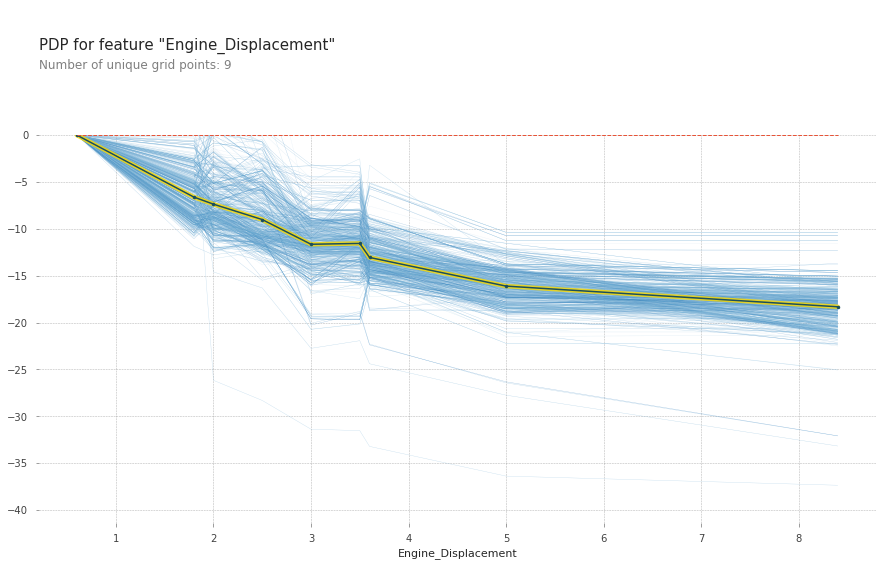

In [197]:
feature = 'Engine_Displacement'

isolated = pdp_isolate(
    model=randomforest, 
    dataset=Xvalidate, 
    model_features=Xvalidate.columns, 
    feature=feature
)

pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=.3);

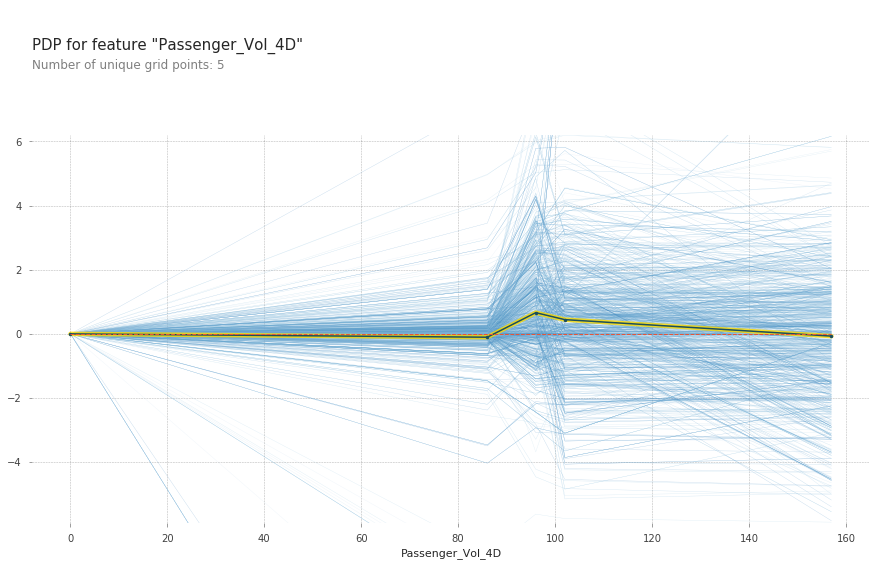

In [233]:
# feature = 'Year'
feature = 'Passenger_Vol_4D'

isolated = pdp_isolate(
    model=randomforest, 
    dataset=pd.concat([Xvalidate, Xtest]),
    model_features=Xvalidate.columns, 
    feature=feature
)

pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=.3);

**3D Partial Dependence Plot**

In [225]:
Xtest.columns

Index(['Cylinders', 'Engine_Displacement', 'Drive', 'Fuel_Type',
       'Passenger_Vol_2D', 'Passenger_Vol_4D', 'Year', 'Transmission',
       'Vehicle_Class', 'Conventional'],
      dtype='object')

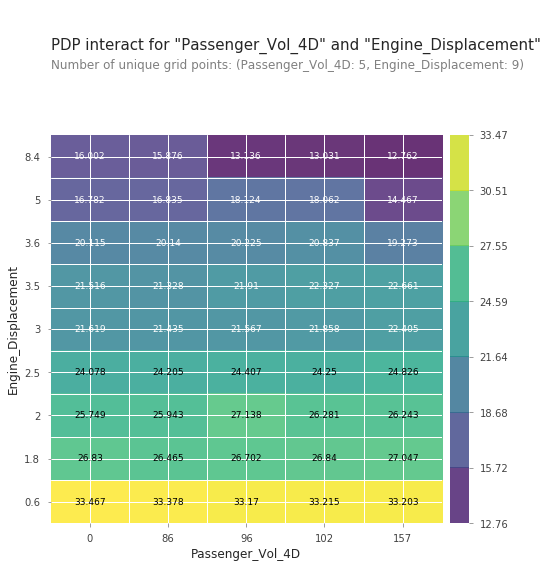

In [234]:
# 273 lesson
from pdpbox.pdp import pdp_interact, pdp_interact_plot

# features = ['Year', 'Engine_Displacement']
features = ['Passenger_Vol_4D', 'Engine_Displacement']

interaction = pdp_interact(
    model=randomforest, 
    dataset=pd.concat([Xvalidate, Xtest]), 
    model_features=Xtest.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

In [235]:
interaction.pdp

,Passenger_Vol_4D,Engine_Displacement,preds
0,0.0,0.6,33.467019
1,0.0,1.8,26.830204
2,0.0,2.0,25.748799
3,0.0,2.5,24.077654
4,0.0,3.0,21.618650
5,0.0,3.5,21.515788
6,0.0,3.6,20.114782
7,0.0,5.0,16.781928
8,0.0,8.4,16.002475
9,86.0,0.6,33.378149


In [236]:
pdp = interaction.pdp.pivot_table(
    values='preds',
    columns=features[0],
    index=features[1]
)
pdp

Passenger_Vol_4D,0.0,86.0,96.0,102.0,157.0
Engine_Displacement,,,,,
0.6,33.467019,33.378149,33.169560,33.214661,33.203068
1.8,26.830204,26.464751,26.701600,26.840258,27.046959
2.0,25.748799,25.943108,27.137659,26.280888,26.243323
2.5,24.077654,24.204878,24.407013,24.249631,24.826237
3.0,21.618650,21.435455,21.567369,21.858470,22.404691
3.5,21.515788,21.328362,21.909734,22.327348,22.661030
3.6,20.114782,20.140237,20.224503,20.836742,19.273178
5.0,16.781928,16.835236,18.124432,18.061515,14.467463
8.4,16.002475,15.876255,13.136038,13.030582,12.762262


In [240]:
import plotly.graph_objs as go

surface = go.Surface(x=pdp.columns, 
                     y=pdp.index, 
                     z=pdp.values)

fig = go.Figure(surface)

fig.update_layout(
    title=go.layout.Title(
#         text="Effect of Model Year and Engine Displacement on MPG",
        text="Effect of Vehicle Size Model Year and Engine Displacement on MPG",
        xref="paper",
#         x=0
    )
)

fig.update_layout(scene = dict(
#                     xaxis_title='Model Year',
                    xaxis_title='Vehicle Size',
                    yaxis_title='Displacement Volumne',
                    zaxis_title='MPG'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=30))
fig.update_layout(scene = dict(
                    xaxis = dict(
#                         ticktext= ['TICKS','MESH','PLOTLY','PYTHON'],
#                         tickvals= [0,50,75,-50]),
                        ticktext=['0', '86', '96', '102', '156'],
                        tickvals=[0, 8, 96, 102, 156])
#                         ticktext=['2017', '2018', '2019', '2020'],
#                         tickvals=[2017, 2018, 2019, 2020])
                        )
)
fig.show()

**Randomforest with Shapley Values**

In [87]:
df3.head()

,Cylinders,Engine_Displacement,Drive,Fuel_Type,Passenger_Vol_2D,Passenger_Vol_4D,Year,Transmission,Combined_MPG,Vehicle_Class,Conventional
0,4,2.0,Rear-Wheel Drive,Regular,0,0,1985,Manual 5-spd,0.0,Two Seaters,True
1,12,4.9,Rear-Wheel Drive,Regular,0,0,1985,Manual 5-spd,0.0,Two Seaters,True
2,4,2.2,Front-Wheel Drive,Regular,0,0,1985,Manual 5-spd,0.0,Subcompact Cars,True
3,8,5.2,Rear-Wheel Drive,Regular,0,0,1985,Automatic 3-spd,0.0,Vans,True
4,4,2.2,4-Wheel or All-Wheel Drive,Premium,0,90,1993,Manual 5-spd,0.0,Compact Cars,True


In [203]:
#redot train/validate/test split
# train = df2[(df2.year > 2007) & (df2.year < 2017)] # new mpg measurement method put in place in 2008
# validate = df2[(df2.year > 2016) & (df2.year < 2019)]
# test = df2[df2.year > 2018]
# train.shape, validate.shape, test.shape
train = df3[(df3.Year > 2007) & (df3.Year < 2017)] # new mpg measurement method put in place in 2008
validate = df3[(df3.Year > 2016) & (df3.Year < 2019)]
test = df3[df3.Year > 2018]
train.shape, validate.shape, test.shape

((10270, 11), (2432, 11), (1781, 11))

In [204]:
#redo split into X matrices and y vectors
# features = ['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year']
features = ['Cylinders', 'Engine_Displacement', 'Passenger_Vol_2D', 'Passenger_Vol_4D', 'Year']
target = 'Combined_MPG'

Xtrain = train[features]
ytrain = train[target]
Xvalidate = validate[features]
yvalidate = validate[target]
Xtest = test[features]
ytest = test[target]

In [205]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier

#pipeline to deal with cardinal features and empty values
processor = make_pipeline(
    ce.OneHotEncoder(),
    SimpleImputer(strategy='median')
)

# transform using the processor pipeline
Xtrain_processed = processor.fit_transform(Xtrain)
Xvalidate_processed = processor.transform(Xvalidate)

eval_set = [(Xtrain_processed, ytrain), 
            (Xvalidate_processed, yvalidate)]

model = XGBRegressor(n_estimators=1000, n_jobs=-1)
model.fit(Xtrain_processed, ytrain, eval_set=eval_set, # eval_metric='auc', 
          early_stopping_rounds=10)

[09:44:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:19.4827	validation_1-rmse:21.4301
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 10 rounds.
[1]	validation_0-rmse:17.5779	validation_1-rmse:19.4082
[2]	validation_0-rmse:15.8677	validation_1-rmse:17.5747
[3]	validation_0-rmse:14.3329	validation_1-rmse:15.9473
[4]	validation_0-rmse:12.9566	validation_1-rmse:14.4726
[5]	validation_0-rmse:11.7232	validation_1-rmse:13.1749
[6]	validation_0-rmse:10.6191	validation_1-rmse:12.0264
[7]	validation_0-rmse:9.63016	validation_1-rmse:10.9761
[8]	validation_0-rmse:8.74718	validation_1-rmse:10.0257
[9]	validation_0-rmse:7.95991	validation_1-rmse:9.17744
[10]	validation_0-rmse:7.25886	validation_1-rmse:8.44145
[11]	validation_0-rmse:6.63624	validation_1-rmse:7.79285
[12]	validation_0-rmse:6.08192	validatio

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [206]:
Xtrain.isnull().sum()

Cylinders              0
Engine_Displacement    0
Passenger_Vol_2D       0
Passenger_Vol_4D       0
Year                   0
dtype: int64

In [207]:
Xtrain.iloc[[0]].values

array([[4.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 2.008e+03]])

In [209]:
# Xtrain.displ = Xtrain.displ.fillna(0)
# Xtrain.cylinders = Xtrain.cylinders.fillna(0)

In [210]:
param_distributions = { 
    'n_estimators': randint(50, 500), 
    'max_depth': [5, 10, 15, 20, None], 
    'max_features': uniform(0, 1), 
}

search = RandomizedSearchCV(
    RandomForestRegressor(random_state=42), 
    param_distributions=param_distributions, 
    n_iter=5, 
    cv=2, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1
)

search.fit(Xtrain, ytrain);

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    2.3s remaining:    5.5s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    2.4s remaining:    2.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    2.5s remaining:    1.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    2.6s finished


In [211]:
print('Best hyperparameters', search.best_params_)
print('Cross-validation MAE', -search.best_score_)
model = search.best_estimator_

Best hyperparameters {'max_depth': 20, 'max_features': 0.0880422561863502, 'n_estimators': 164}
Cross-validation MAE 1.8978671206108642


In [150]:
def predict(cylinders, displacement, pass_volume, year, pv2=0):
    df = pd.DataFrame(
        data=[[cylinders, displacement, pv2, pass_volume, year]],
        columns=['cylinders', 'displ', 'pv2', 'pv4', 'year']
    )
    pred = model.predict(df)[0]
    
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(df)
    
    feature_names = df.columns
    feature_values = df.values[0]
    shaps = pd.Series(shap_values[0], zip(feature_names, feature_values))
    
    result = f'Rent is estimated at ${pred:,.0f} for this New York City apartment. \n\n'
    result += f'Starting from a baseline of ${explainer.expected_value:,.0f}. \n'
    result += shaps.to_string()
    print(result)
    
    shap.initjs()
    return shap.force_plot(
        base_value=explainer.expected_value, 
        shap_values=shap_values,
        features=df
    )

predict(cylinders=2, displacement=6, pv2=0, pass_volume=94, year=2011)

ValueError: feature_names mismatch: ['f0', 'f1', 'f2', 'f3', 'f4'] ['cylinders', 'displ', 'pv2', 'pv4', 'year']
expected f1, f0, f4, f2, f3 in input data
training data did not have the following fields: cylinders, pv2, year, displ, pv4

In [136]:
from random import randrange

for f in range(1,2):
    df_shap = pd.DataFrame(
            data=Xtrain.iloc[[randrange(9400)]].values,
            columns=['cylinders', 'displ', 'pv2', 'pv4', 'year']
        )
    pred = model.predict(df_shap)[0]
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(df_shap)
    shap.initjs()
    shap.force_plot(
        base_value=explainer.expected_value, 
        shap_values=shap_values,
        features=df_shap
    )
# plot_shap;

In [219]:
df_shap = pd.DataFrame(
        data=Xtrain.iloc[[randrange(9400)]].values,
        columns=['cylinders', 'displ', 'pv2', 'pv4', 'year']
    )
pred = model.predict(df_shap)[0]
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(df_shap)
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=df_shap
)

In [212]:
from random import randrange

df_shap = pd.DataFrame(
#         data=[[cylinders, displacement, pv2, pass_volume, year]],
#         data=[[2, 6, 0, 94, 2011]],
        data=Xtrain.iloc[[randrange(9400)]].values,
        columns=['cylinders', 'displ', 'pv2', 'pv4', 'year']
    )
df_shap

,cylinders,displ,pv2,pv4,year
0,8.0,5.3,0.0,0.0,2008.0


In [213]:
pred = model.predict(df_shap)[0]
pred

15.338404830490878

In [214]:
explainer = shap.TreeExplainer(model)
explainer

In [215]:
shap_values = explainer.shap_values(df_shap)
shap_values

array([[-1.84330906, -2.35952091, -0.14333549, -0.71121983, -1.03231845]])

In [216]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=df_shap
)

**-------------------------------------------------------------------------------------------------------------------------------------------------------------------**

In [70]:
train.head()

,cylinders,displ,drive,fuelType,pv2,pv4,trany,year,comb08U
15387,4.0,2.0,Front-Wheel Drive,Premium,0,0,Automatic (S6),2008,0.0
15388,6.0,3.2,4-Wheel or All-Wheel Drive,Premium,0,0,Manual 6-spd,2008,0.0
15389,6.0,3.2,4-Wheel or All-Wheel Drive,Premium,0,0,Automatic (S6),2008,0.0
15390,8.0,4.2,Rear-Wheel Drive,Premium,74,0,Automatic 6-spd,2008,0.0
15391,8.0,4.2,Rear-Wheel Drive,Premium,74,0,Automatic 6-spd,2008,0.0


In [71]:
#split into X matrix and y vector
Xtrain = train[['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year']]
ytrain = train['comb08U']

In [115]:
Xvalidate = validate[['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year']]
yvalidate = validate['comb08U']
Xtest = test[['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year']]
ytest = test['comb08U']

In [33]:
ytrain

6210      0.0000
6212      0.0000
6213      0.0000
6214      0.0000
6215      0.0000
          ...   
31323    27.1908
31330    30.1000
31333    85.7115
31551    15.6633
31552    15.6633
Name: comb08U, Length: 19004, dtype: float64

In [34]:
Xtrain

,co2TailpipeGpm,cylinders,displ,drive,fuelType,pv2,pv4,trany,year
6210,493.722222,6.0,3.0,Rear-Wheel Drive,Premium,0,0,Automatic 4-spd,2000
6212,493.722222,6.0,3.2,Rear-Wheel Drive,Premium,0,0,Manual 6-spd,2000
6213,467.736842,6.0,3.2,Rear-Wheel Drive,Premium,0,0,Manual 5-spd,2000
6214,467.736842,6.0,2.8,Rear-Wheel Drive,Premium,0,0,Automatic 4-spd,2000
6215,467.736842,6.0,2.8,Rear-Wheel Drive,Premium,0,0,Manual 5-spd,2000
6216,467.736842,6.0,2.5,Rear-Wheel Drive,Premium,0,0,Automatic 4-spd,2000
6217,444.350000,6.0,2.5,Rear-Wheel Drive,Premium,0,0,Manual 5-spd,2000
6218,467.736842,6.0,2.8,Rear-Wheel Drive,Premium,0,0,Automatic 4-spd,2000
6219,467.736842,6.0,2.8,Rear-Wheel Drive,Premium,0,0,Manual 5-spd,2000
6220,592.466667,8.0,4.9,Rear-Wheel Drive,Premium,0,0,Manual 6-spd,2000


In [35]:
Xtrain.shape, ytrain.shape

((19004, 9), (19004,))

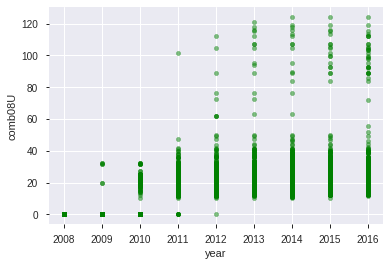

In [73]:
train.plot(x='year', y='comb08U', kind='scatter', color='g', alpha=0.5);

**Random Forest Regression Model**

In [74]:
randomforest = make_pipeline(
#     ce.OrdinalEncoder(), # probably not best choice since there's no true order for these categorical features
    ce.OneHotEncoder(), 
    SimpleImputer(strategy='median'), 
    RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)
)

randomforest.fit(Xtrain, ytrain)
Xtrain.shape, ytrain.shape

((10716, 8), (10716,))

In [75]:
y_pred = randomforest.predict(Xvalidate)


In [76]:
mae = mean_absolute_error(yvalidate, y_pred)
r2 = r2_score(yvalidate, y_pred)
print('Mean Absolute Error:', mae)
print('R^2:', r2)

Mean Absolute Error: 1.3879979825244313
R^2: 0.9490966209343517


In [77]:
Xtrain.head()

,cylinders,displ,drive,fuelType,pv2,pv4,trany,year
15387,4.0,2.0,Front-Wheel Drive,Premium,0,0,Automatic (S6),2008
15388,6.0,3.2,4-Wheel or All-Wheel Drive,Premium,0,0,Manual 6-spd,2008
15389,6.0,3.2,4-Wheel or All-Wheel Drive,Premium,0,0,Automatic (S6),2008
15390,8.0,4.2,Rear-Wheel Drive,Premium,74,0,Automatic 6-spd,2008
15391,8.0,4.2,Rear-Wheel Drive,Premium,74,0,Automatic 6-spd,2008


**Gradient Boost Model**

In [81]:
gradientboost = make_pipeline(
    ce.OneHotEncoder(), 
    SimpleImputer(strategy='median'),
    XGBRegressor(n_estimators=200, objective='reg:squarederror', n_jobs=-1)
)

gradientboost.fit(Xtrain, ytrain)
y_pred = gradientboost.predict(Xvalidate)
# y_pred = np.expm1(y_pred_log)
print('Gradient Boosting R^2', r2_score(yvalidate, y_pred))

Gradient Boosting R^2 0.9394957392585508


**Linear Regression Model**

In [97]:
linearregression = make_pipeline(
    ce.OneHotEncoder(), 
    SimpleImputer(strategy='median'),
    LinearRegression()
)

linearregression.fit(Xtrain, ytrain)
# y_pred = linearregression.predict(Xvalidate)
print('Linear Regression R^2', linearregression.score(Xvalidate, yvalidate))

Linear Regression R^2 0.404718535599346


**Individual Conditional Expectation (ICE) and Partial Dependence Plots**

In [82]:
example = Xvalidate.iloc[[0]]
example

,cylinders,displ,drive,fuelType,pv2,pv4,trany,year
29912,4.0,2.0,Front-Wheel Drive,Regular,0,0,Automatic (S6),2017


In [87]:
def predict(model, example, log=False):
    print('Vary passenger volume, hold other features constant', '\n')
    example = example.copy()
    preds = []
    for pass_vol in range(60, 100, 5):
        example['pv2'] = pass_vol
        pred = model.predict(example)[0]
        if log:
            pred = np.expm1(pred)
        print(f'Predicted MPG: {pred:.1f}')
        print(example.to_string(), '\n')
        preds.append(pred)
    print('Difference between predictions')
    print(np.diff(preds))
        
predict(randomforest, example)

Vary passenger volume, hold other features constant 

Predicted MPG: 26.5
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    2.0  Front-Wheel Drive  Regular   60    0  Automatic (S6)  2017 

Predicted MPG: 26.5
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    2.0  Front-Wheel Drive  Regular   65    0  Automatic (S6)  2017 

Predicted MPG: 26.5
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    2.0  Front-Wheel Drive  Regular   70    0  Automatic (S6)  2017 

Predicted MPG: 26.5
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    2.0  Front-Wheel Drive  Regular   75    0  Automatic (S6)  2017 

Predicted MPG: 26.5
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    2.0  Front-Wheel Drive  Regular   80    0  Automatic (S6)  201

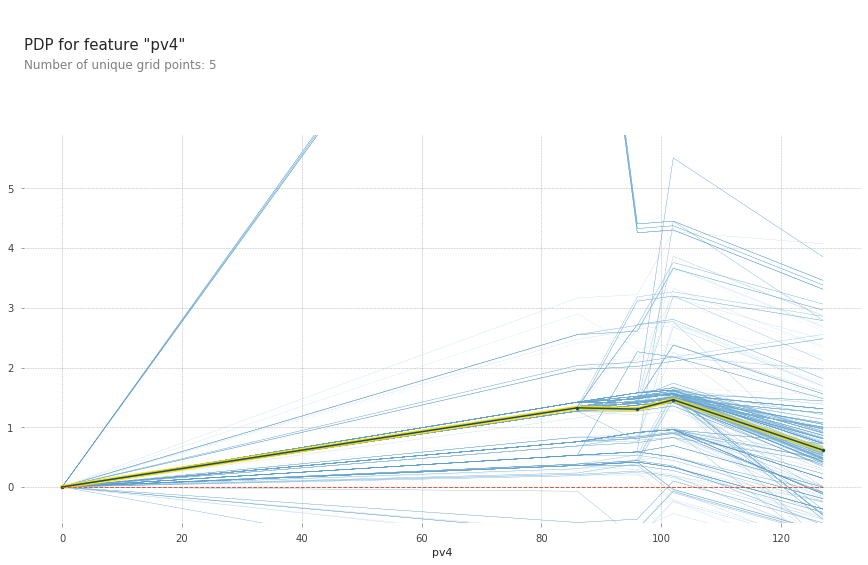

In [99]:
feature = 'pv4'

isolated = pdp_isolate(
    model=gradientboost, 
    dataset=Xvalidate, 
    model_features=Xvalidate.columns, 
    feature=feature
)

pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=.3);

In [103]:
def predict(model, example, log=False):
    print('Vary engine displacement, hold other features constant', '\n')
    example = example.copy()
    preds = []
    for displacement in np.arange(0.6, 8.4, .1):
        example['displ'] = displacement
        pred = model.predict(example)[0]
        if log:
            pred = np.expm1(pred)
        print(f'Predicted MPG: {pred:.1f}')
        print(example.to_string(), '\n')
        preds.append(pred)
    print('Difference between predictions')
    print(np.diff(preds))
        
predict(randomforest, example)

Vary engine displacement, hold other features constant 

Predicted MPG: 34.0
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    0.6  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 34.0
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    0.7  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 33.4
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    0.8  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 33.4
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    0.9  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 33.4
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    1.0  Front-Wheel Drive  Regular    0    0  Automatic (S6)  

Predicted MPG: 16.5
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    4.9  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 16.8
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    5.0  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 16.8
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    5.1  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 17.3
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    5.2  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 17.4
       cylinders  displ              drive fuelType  pv2  pv4           trany  year
29912        4.0    5.3  Front-Wheel Drive  Regular    0    0  Automatic (S6)  2017 

Predicted MPG: 15.2
       cylinders  displ       

In [118]:
#replace nulls manually since simple imputer did not
# displ and cylinders
Xvalidate.displ = Xvalidate.displ.fillna(0)
Xvalidate.cylinders = Xvalidate.cylinders.fillna(0)

In [119]:
Xvalidate.isnull().sum()

cylinders    0
displ        0
drive        0
fuelType     0
pv2          0
pv4          0
trany        0
year         0
dtype: int64

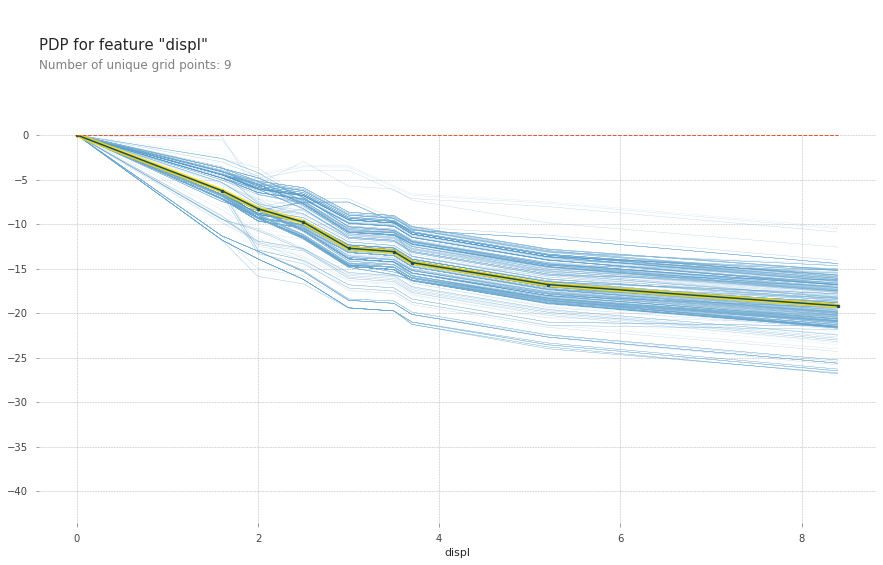

In [121]:
feature = 'displ'

isolated = pdp_isolate(
    model=gradientboost, 
#     model=linearregression,
    dataset=Xvalidate, 
    model_features=Xvalidate.columns, 
    feature=feature
)

pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=.3);

**Randomforest with Shapley Values**

In [124]:
from scipy.stats import randint, uniform
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import shap

In [122]:
df2.head()

,cylinders,displ,drive,fuelType,pv2,pv4,trany,year,comb08U
0,4.0,2.0,Rear-Wheel Drive,Regular,0,0,Manual 5-spd,1985,0.0
1,12.0,4.9,Rear-Wheel Drive,Regular,0,0,Manual 5-spd,1985,0.0
2,4.0,2.2,Front-Wheel Drive,Regular,0,0,Manual 5-spd,1985,0.0
3,8.0,5.2,Rear-Wheel Drive,Regular,0,0,Automatic 3-spd,1985,0.0
4,4.0,2.2,4-Wheel or All-Wheel Drive,Premium,0,90,Manual 5-spd,1993,0.0


In [135]:
#redot train/validate/test split
train = df2[(df2.year > 2007) & (df2.year < 2017)] # new mpg measurement method put in place in 2008
validate = df2[(df2.year > 2016) & (df2.year < 2019)]
test = df2[df2.year > 2018]
train.shape, validate.shape, test.shape

((10716, 9), (2637, 9), (1919, 9))

In [136]:
#redo split into X matrices and y vectors
# features = ['cylinders', 'displ', 'drive', 'fuelType', 'pv2', 'pv4', 'trany', 'year']
features = ['cylinders', 'displ', 'pv2', 'pv4', 'year']
target = 'comb08U'

Xtrain = train[features]
ytrain = train[target]
Xvalidate = validate[features]
yvalidate = validate[target]
Xtest = test[features]
ytest = test[target]

In [146]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier

#pipeline to deal with cardinal features and empty values
processor = make_pipeline(
    ce.OneHotEncoder(),
    SimpleImputer(strategy='median')
)

# transform using the processor pipeline
Xtrain_processed = processor.fit_transform(Xtrain)
Xvalidate_processed = processor.transform(Xvalidate)

eval_set = [(Xtrain_processed, ytrain), 
            (Xvalidate_processed, yvalidate)]

model = XGBRegressor(n_estimators=1000, n_jobs=-1)
model.fit(Xtrain_processed, ytrain, eval_set=eval_set, # eval_metric='auc', 
          early_stopping_rounds=10)

[08:27:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:18.5369	validation_1-rmse:25.3535
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 10 rounds.
[1]	validation_0-rmse:16.7863	validation_1-rmse:23.0109
[2]	validation_0-rmse:15.2196	validation_1-rmse:20.9188
[3]	validation_0-rmse:13.8167	validation_1-rmse:19.0311
[4]	validation_0-rmse:12.5642	validation_1-rmse:17.3653
[5]	validation_0-rmse:11.445	validation_1-rmse:15.8481
[6]	validation_0-rmse:10.4498	validation_1-rmse:14.5144
[7]	validation_0-rmse:9.56283	validation_1-rmse:13.2817
[8]	validation_0-rmse:8.77718	validation_1-rmse:12.1943
[9]	validation_0-rmse:8.08115	validation_1-rmse:11.2461
[10]	validation_0-rmse:7.46682	validation_1-rmse:10.3913
[11]	validation_0-rmse:6.92561	validation_1-rmse:9.6212
[12]	validation_0-rmse:6.45184	validation_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [142]:
Xtrain.isnull().sum()

cylinders    0
displ        0
pv2          0
pv4          0
year         0
dtype: int64

In [141]:
Xtrain.displ = Xtrain.displ.fillna(0)
Xtrain.cylinders = Xtrain.cylinders.fillna(0)

In [158]:
param_distributions = { 
    'n_estimators': randint(50, 500), 
    'max_depth': [5, 10, 15, 20, None], 
    'max_features': uniform(0, 1), 
}

search = RandomizedSearchCV(
    RandomForestRegressor(random_state=42), 
    param_distributions=param_distributions, 
    n_iter=5, 
    cv=2, 
    scoring='neg_mean_absolute_error', 
    verbose=10, 
    return_train_score=True, 
    n_jobs=-1
)

search.fit(Xtrain, ytrain);

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    2.0s remaining:    4.8s
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:    2.5s remaining:    2.5s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    2.7s remaining:    1.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    3.0s finished


In [159]:
print('Best hyperparameters', search.best_params_)
print('Cross-validation MAE', -search.best_score_)
model = search.best_estimator_

Best hyperparameters {'max_depth': 20, 'max_features': 0.12719487787995054, 'n_estimators': 63}
Cross-validation MAE 6.145024298425819


In [150]:
def predict(cylinders, displacement, pass_volume, year, pv2=0):
    df = pd.DataFrame(
        data=[[cylinders, displacement, pv2, pass_volume, year]],
        columns=['cylinders', 'displ', 'pv2', 'pv4', 'year']
    )
    pred = model.predict(df)[0]
    
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(df)
    
    feature_names = df.columns
    feature_values = df.values[0]
    shaps = pd.Series(shap_values[0], zip(feature_names, feature_values))
    
    result = f'Rent is estimated at ${pred:,.0f} for this New York City apartment. \n\n'
    result += f'Starting from a baseline of ${explainer.expected_value:,.0f}. \n'
    result += shaps.to_string()
    print(result)
    
    shap.initjs()
    return shap.force_plot(
        base_value=explainer.expected_value, 
        shap_values=shap_values,
        features=df
    )

predict(cylinders=2, displacement=6, pv2=0, pass_volume=94, year=2011)

ValueError: feature_names mismatch: ['f0', 'f1', 'f2', 'f3', 'f4'] ['cylinders', 'displ', 'pv2', 'pv4', 'year']
expected f1, f0, f4, f2, f3 in input data
training data did not have the following fields: cylinders, pv2, year, displ, pv4

In [156]:
df_shap = pd.DataFrame(
#         data=[[cylinders, displacement, pv2, pass_volume, year]],
        data=[[2, 6, 0, 94, 2011]],
        columns=['cylinders', 'displ', 'pv2', 'pv4', 'year']
    )
df_shap

,cylinders,displ,pv2,pv4,year
0,2,6,0,94,2011


In [162]:
pred = model.predict(df_shap)[0]
pred

19.73741632225955

In [163]:
explainer = shap.TreeExplainer(model)
explainer

In [164]:
shap_values = explainer.shap_values(df_shap)
shap_values

array([[ 2.27968297, -3.78785228, -0.10952321,  0.24599851,  5.29453285]])

In [165]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=df_shap
)

**Linear Regression**

In [ ]:
# lrdf = df.copy()

In [166]:
features

['cylinders', 'displ', 'pv2', 'pv4', 'year']

**Univariate Feature Selection**

In [178]:
df_ufs.columns

Index(['barrels08', 'barrelsA08', 'charge120', 'charge240', 'city08',
       'city08U', 'cityA08', 'cityA08U', 'cityCD', 'cityE', 'cityUF', 'co2',
       'co2A', 'co2TailpipeAGpm', 'co2TailpipeGpm', 'comb08', 'comb08U',
       'combA08', 'combA08U', 'combE', 'combinedCD', 'combinedUF', 'cylinders',
       'displ', 'drive', 'engId', 'eng_dscr', 'feScore', 'fuelCost08',
       'fuelCostA08', 'fuelType', 'fuelType1', 'ghgScore', 'ghgScoreA',
       'highway08', 'highway08U', 'highwayA08', 'highwayA08U', 'highwayCD',
       'highwayE', 'highwayUF', 'hlv', 'hpv', 'id', 'lv2', 'lv4', 'make',
       'model', 'mpgData', 'phevBlended', 'pv2', 'pv4', 'range', 'rangeCity',
       'rangeCityA', 'rangeHwy', 'rangeHwyA', 'trany', 'UCity', 'UCityA',
       'UHighway', 'UHighwayA', 'VClass', 'year', 'youSaveSpend', 'guzzler',
       'trans_dscr', 'tCharger', 'sCharger', 'atvType', 'fuelType2', 'rangeA',
       'evMotor', 'mfrCode', 'c240Dscr', 'charge240b', 'c240bDscr',
       'createdOn', 'modifiedOn

In [217]:
#should first split out a test dataset
df_ufs = df.copy()
# df_ufs_subset = df_ufs.select_dtypes('number').dropna(axis='columns')
# df_ufs_subset = df_ufs[keep_cols]
df_ufs_subset = df_ufs[keep_cols].select_dtypes('number').dropna(axis='columns')
target='comb08U'
features = df_ufs_subset.columns.drop(target)
Xtrain = df_ufs_subset[features]
ytrain = df_ufs_subset[target]

In [218]:
imputer = SimpleImputer(strategy='median')
Xtrainimpute = imputer.fit_transform(Xtrain)

In [219]:
encoder = ce.OneHotEncoder(use_cat_names=True)
Xtrainencode = encoder.fit_transform(Xtrainimpute)

In [220]:
scaler = StandardScaler()
Xtrainscale = scaler.fit_transform(Xtrainencode)

In [221]:
from sklearn.feature_selection import f_regression, SelectKBest
selector = SelectKBest(score_func=f_regression, k=all)
Xtrain_selected = selector.fit_transform(Xtrainscale, ytrain)

TypeError: '<=' not supported between instances of 'int' and 'builtin_function_or_method'

In [177]:
all_names = Xtrain.columns
selected_mask = selector.get_support()
all_names[selected_mask]

Index(['barrels08', 'charge240', 'city08', 'city08U', 'co2', 'co2TailpipeGpm',
       'comb08', 'combE', 'feScore', 'ghgScore', 'highway08', 'highway08U',
       'highwayE', 'id', 'range', 'rangeCity', 'rangeHwy', 'UCity', 'UHighway',
       'year'],
      dtype='object')

In [202]:
df_ufs_subset = df_ufs[keep_cols]

In [203]:
df_ufs_subset.describe(exclude='number').T.sort_values(by='unique')

,count,unique,top,freq
drive,40348,7,Front-Wheel Drive,14323
fuelType,41537,14,Regular,26619
trany,41526,37,Automatic 4-spd,11047


In [196]:
df_ufs_subset.trany.value_counts()

Automatic 4-spd                     11047
Manual 5-spd                         8362
Automatic 3-spd                      3151
Automatic (S6)                       3136
Manual 6-spd                         2774
Automatic 5-spd                      2203
Automatic (S8)                       1752
Automatic 6-spd                      1674
Manual 4-spd                         1483
Automatic (variable gear ratios)      843
Automatic (S5)                        833
Automatic 7-spd                       724
Automatic 8-spd                       482
Automatic (AM-S7)                     441
Automatic 9-spd                       339
Automatic (S7)                        327
Automatic (AM7)                       254
Automatic (S4)                        233
Automatic (AV-S6)                     212
Automatic (A1)                        204
Automatic (AM6)                       153
Automatic (AV-S7)                     143
Automatic (S10)                       131
Automatic (AM-S6)                 

In [215]:
df.pv2.value_counts()

0      34798
84       380
85       367
70       367
81       335
89       320
82       307
91       299
90       275
80       270
87       262
78       255
76       251
88       233
86       211
68       207
98       199
92       194
77       192
83       167
74       152
93       147
96       143
79       133
94       117
97       113
75       107
95       104
99        65
48        48
102       47
72        38
55        36
50        35
101       32
52        31
100       29
49        23
109       22
64        21
106       21
107       18
6         18
105       15
71        14
110       14
46        11
56        11
10        10
69         9
7          8
73         8
67         8
9          6
45         6
103        5
193        4
194        3
8          3
43         3
47         2
1          2
40         2
2          1
51         1
28         1
108        1
Name: pv2, dtype: int64

**Finding values for plotly app**

In [161]:
# df3.Cylinders.value_counts()
# df3.Cylinders.unique()
np.sort(df3.Engine_Displacement.unique())
# df3.Drive.unique()
# df3.Fuel_Type.unique()
# df3.Transmission.unique()
# df3.Vehicle_Class.unique()

array([0.9, 1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1,
       2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4,
       3.5, 3.6, 3.7, 3.8, 3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7,
       4.8, 4.9, 5. , 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1,
       6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 7. , 7.4, 8. , 8.3, 8.4])

In [163]:
#checking value types
df3.dtypes

Cylinders                int64
Engine_Displacement    float64
Drive                   object
Fuel_Type               object
Passenger_Vol_2D         int64
Passenger_Vol_4D         int64
Year                     int64
Transmission            object
Combined_MPG           float64
Vehicle_Class           object
Conventional              bool
dtype: object